In [3]:
import pandas as pd
import pymysql
import cv2
from matplotlib import pyplot as plt
import sys
from matplotlib import pyplot as plt
import matplotlib
%matplotlib inline
import pandas as pd
from pandas import DataFrame

In [4]:
conn = pymysql.connect(host='localhost',user='root',passwd='####',port = 3306,db='taobao',charset='utf8')
cur=conn.cursor

In [5]:
sql = "select * from taobao.image where isSaved_Picture = 1 and position<>'2' limit 5000000;"
image_list = pd.read_sql(sql, con=conn) 

In [6]:
sql1="select product_id from taobao.product_information where cumulative_review <> 0 and transaction_volume <> 0"
valid_product=pd.read_sql(sql1, con=conn) 

In [7]:
import os
path = '../任务二/3.获取图片'
files= os.listdir(path) #得到文件夹下的所有文件名称

In [8]:
from numpy import mean, ptp, var, std
import numpy as np
import math
import time

In [9]:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
from numba import jit
from numba import njit
from numba import vectorize

RGB color var: Sum of variance in terms of r,g and b channel of an image <br>
H_color: Variance of h in terms of HSV channel of an image <br>
HS_color_var: Sum of variance of h and s in HSV channel of an image <br>
HSV_color_var: Sum of variance of h,s and v in HSV channel of an image <br>
Entropy: shannon's entropy of a gray scale image <br>
Clear: Image clarity using Sobel gradient 

In [247]:
def RGB_color_var(RGB_img):   
    r,g,b = cv2.split(RGB_img)
    var_r = var(r)
    var_g = var(g)
    var_b = var(b)
    RGB_color_var = var_r+var_g+var_b
    return round(RGB_color_var,4)


def H_color_var(HSV_img):
    h = HSV_img[...,0]
    HSV_color_var = var(h)
    #print(HSV_color_var)
    return round(HSV_color_var,4)


def HS_color_var(HSV_img):
    H, S, V = cv2.split(HSV_img)
    H1 = np.array(H).flatten()
    S1 = np.array(S).flatten()
  
    x,y=cacul2(H1,S1)

    var_h=var(x)
    var_s=var(y)
    HS_color_var = var_h+var_s
    return round(HS_color_var,4)


def HSV_color_var(HSV_img):
    H, S, V = cv2.split(HSV_img)
    H1 = np.array(H).flatten()
    S1 = np.array(S).flatten()
    V1 = np.array(V).flatten()
    x,y,z=cacul(H1,S1,V1)
    
    var_h=var(x)
    var_s=var(y)
    var_v=var(z)
    HSV_color_var = var_h+var_s+var_v
    return round(HSV_color_var,4)


def clear(img):
    clearsobel = cv2.Sobel(img,cv2.CV_16S, 1, 1)
    clearsobel=abs(clearsobel)
    return round(mean(clearsobel),4)

def entro(img):
    tmpp = []
    for i in range(256):
        tmpp.append(0)
    
    k,tmp=entro1(img,tmpp)
    #print(k)
    for i in range(256):
        tmp[i] = float(tmp[i] / k)
    result=entro2(tmp)
    return round(result,4)


def entro1(img,tmp):
    val=0
    k=0
    D=np.array(img).flatten()
    for i in range(len(D)):
        val = D[i]
        tmp[val] = float(tmp[val] + 1)
        k =  float(k + 1)
    return k,tmp


def entro2(tpm):
    res = 0
    for i in range(256):
        if(tpm[i] == 0):
            res = res
        else:
            res = float(res - tpm[i] * (np.log(tpm[i]) / np.log(2.0)))
    return res


def cacul(A,B,C):
    x=[]
    y=[]
    z=[]
    for i in range(len(A)):
        x1 = 256 * C[i]/255 * B[i]/255 * np.cos(A[i] / 180.0 *2* np.pi)
        y1 = 256 * C[i]/255 * B[i]/255 * np.sin(A[i] / 180.0 *2* np.pi)
        z1 = 256 * C[i]/255
        x.append(x1)
        y.append(y1)
        z.append(z1)
    return x,y,z
        

def cacul2(A,B):
    x=[]
    y=[]
    for i in range(len(A)):
        x1 = 256* B[i]/255 * np.cos(A[i] / 180.0 *2* np.pi)
        y1 = 256* B[i]/255 * np.sin(A[i] / 180.0 *2* np.pi)
        x.append(x1)
        y.append(y1)

    return x,y      

In [244]:
        v1=[]
        v2=[]
        v3=[]
        v4=[]
        v5=[]
        v6=[]
        pic_id=[]

In [245]:
def main(m,n):
        for i in range(m,n):
           #begin =time.time()
           path = image_list.iat[i,9]
           #print(round(time.time() - begin, 4),'s')
           pic_path = 'D:\\image\\' + path + '.jpg';
           #print(pic_path)
           pic_path2 = ''
           picid = image_list.iat[i,8]
        
           if pic_path in files:
                pic_path2 = '../任务二/3.获取图片/' + pic_path  
           if len(pic_path2) == 0:
                 v1.append(None)
                 v2.append(None)
                 v3.append(None)
                 v4.append(None)
                 v5.append(None)
                 v6.append(None)
                 print('E1')
                 continue           
           try:
                img = cv2.imread(pic_path2)
                cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                cv_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                cv_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                #print(cv_grey)
                plt.imshow(cv_rgb)
                
                v1.append(RGB_color_var(cv_rgb))
                v2.append(H_color_var(cv_hsv))           
                v3.append(HS_color_var(cv_hsv))
                v4.append(HSV_color_var(cv_hsv))       
                v5.append(entro(cv_grey))      
                v6.append(clear(cv_grey))
                pic_id.append(picid)
           except:
                print('E2')
                v1.append(None)
                v2.append(None)
                v3.append(None)
                v4.append(None)
                v5.append(None)
                v6.append(None)
                pic_id.append(picid)
           else:
                plt.show()
                
           print(i)
           #image_list.iloc[i,10:16] = values
           #image_list.ix[index,10:16]=values
         

160000.0


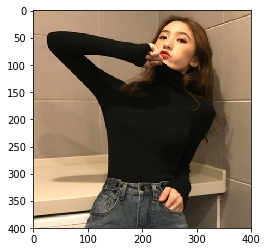

0
160000.0


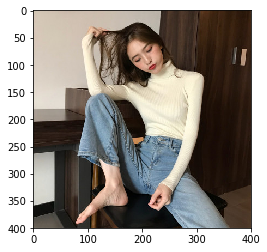

1
160000.0


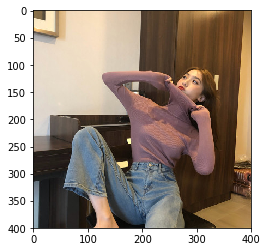

2
160000.0


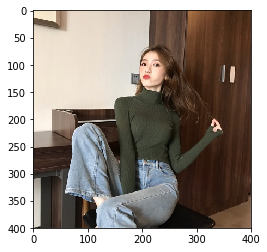

3


In [246]:
main(0,4)

In [214]:
image_list_435w=pd.DataFrame()

image_list_435w['RGB_var']=v1
image_list_435w['H_var']=v2
image_list_435w['HS_var']=v3
image_list_435w['HSV_var']=v4
image_list_435w['entropy']=v5
image_list_435w['clearity']=v6
image_list_435w['id']=pic_id

print(image_list_435w)

      RGB_var      H_var     HS_var    HSV_var  entropy  clearity      id
0  13177.6451   252.2785  2147.2212  7031.2421   7.3744    5.4051  582111
1  18976.5224  1044.0819  7222.5593  7341.4844   7.6033    7.7298  582112
2  13473.9990  2587.6460  5765.0648  6148.8193   7.6130    6.3248  582113
3  17846.9063   926.0433  5416.8204  6430.4320   7.4261    6.2996  582114


In [216]:
image_temp = image_list_435w_left.merge(image_list_435w)
print(image_temp)

     product_id                                            img_src position  \
0  578720289688  http://gd2.alicdn.com/imgextra/i2/818035833/O1...        1   
1  578720289688  http://gd2.alicdn.com/imgextra/i2/818035833/TB...        1   
2  578720289688  http://gd4.alicdn.com/imgextra/i4/818035833/TB...        1   
3  578720289688  http://gd2.alicdn.com/imgextra/i2/818035833/TB...        1   

   sequence update_time from_who review_id isSaved_Picture      id  \
0         1  2019-02-28        1      None               1  582111   
1         2  2019-02-28        1      None               1  582112   
2         3  2019-02-28        1      None               1  582113   
3         4  2019-02-28        1      None               1  582114   

                            pic_md5     RGB_var      H_var     HS_var  \
0  973c034720d1040ee7cb317b9b4afed7  13177.6451   252.2785  2147.2212   
1  db356c3bc4c25ca41d34637d4225061c  18976.5224  1044.0819  7222.5593   
2  8062b085d3ed0c1ff8001f803172119

Canny edge: density of white pixel (edge) in canny output of an image

In [229]:
from collections import Counter

In [230]:
def canny_edge(img):
    edge_output = cv2.Canny(img, 30, 100)
    #edge_output = cv2.Canny(img, np.median(a)/3, np.median(a)*4/3)
    canny_array = np.array(edge_output).flatten()
    static=Counter(canny_array)
    complex=static[255]/img.size*100
    plt.imshow(edge_output)
    plt.show()
    return round(complex,4)

In [231]:
pic_list=image_temp['pic_md5'].tolist()

In [232]:
v7=[]

In [233]:
def main(m,n):
        i=m
        for path in pic_list[m:n]:
           pic_path = 'D:\\image\\' + path + '.jpg'
           pic_path2 = '../任务二/3.获取图片/' + pic_path     

           try:
               img = cv2.imread(pic_path2,cv2.IMREAD_GRAYSCALE)
               a = cv2.GaussianBlur(img, (3, 3), 0)
               v7.append(canny_edge(a))
           except:
               v7.append(None)
           i+=1
     

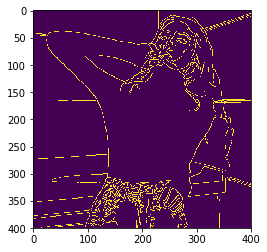

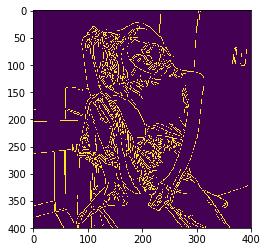

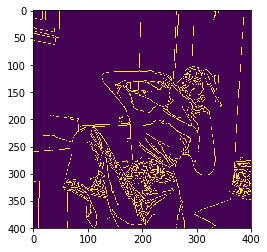

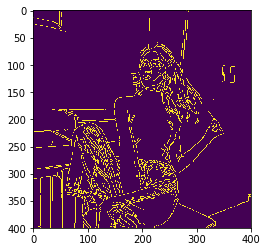

In [234]:
main(0,4)

In [235]:
image_list_addv7 = pd.DataFrame()
image_list_addv7['shape_compexity']=v7
image_list_addv7['id']=pic_id

print(image_list_addv7)

   shape_compexity      id
0           5.4025  582111
1           8.0062  582112
2           6.8419  582113
3           7.0131  582114


In [236]:
image_list_all = image_temp.merge(image_list_addv7)

print(image_list_all)

     product_id                                            img_src position  \
0  578720289688  http://gd2.alicdn.com/imgextra/i2/818035833/O1...        1   
1  578720289688  http://gd2.alicdn.com/imgextra/i2/818035833/TB...        1   
2  578720289688  http://gd4.alicdn.com/imgextra/i4/818035833/TB...        1   
3  578720289688  http://gd2.alicdn.com/imgextra/i2/818035833/TB...        1   

   sequence update_time from_who review_id isSaved_Picture      id  \
0         1  2019-02-28        1      None               1  582111   
1         2  2019-02-28        1      None               1  582112   
2         3  2019-02-28        1      None               1  582113   
3         4  2019-02-28        1      None               1  582114   

                            pic_md5     RGB_var      H_var     HS_var  \
0  973c034720d1040ee7cb317b9b4afed7  13177.6451   252.2785  2147.2212   
1  db356c3bc4c25ca41d34637d4225061c  18976.5224  1044.0819  7222.5593   
2  8062b085d3ed0c1ff8001f803172119

../任务二/3.获取图片/D:\image\cfb2d1d73c1e3e7bcf01ba03f95aa27b.jpg


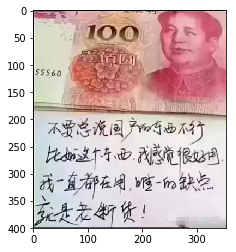

../任务二/3.获取图片/D:\image\16ced5a63ae427b1339df3e1d26c6082.jpg


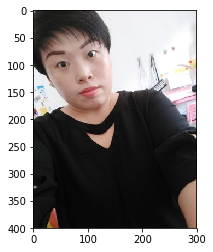

../任务二/3.获取图片/D:\image\163025aa154610ed6ead76d928a0cca8.jpg


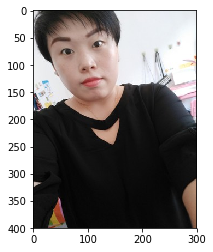

../任务二/3.获取图片/D:\image\4b76726ff33811002c3db556afe04be5.jpg


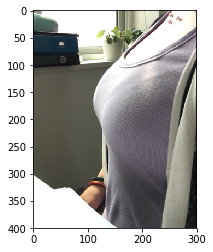

../任务二/3.获取图片/D:\image\358af59d3de45b37fe697fad8ceb5295.jpg


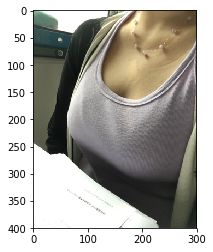

../任务二/3.获取图片/D:\image\eda951a6b0e973a925ee1e6afcfd14bc.jpg


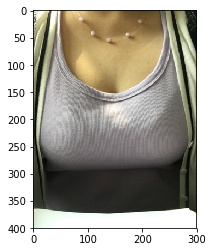

../任务二/3.获取图片/D:\image\0b9683ac3b6ec84abec194faf823c848.jpg


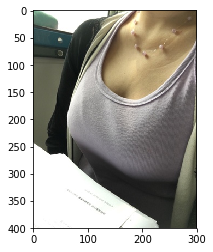

../任务二/3.获取图片/D:\image\f54c440daf95acb8eb1c9c98f60c2ce4.jpg


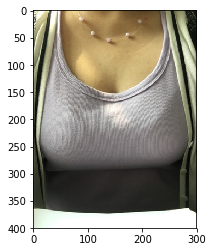

../任务二/3.获取图片/D:\image\dd65f3dbb8a8919fbbc1af1fd4a7e2d1.jpg


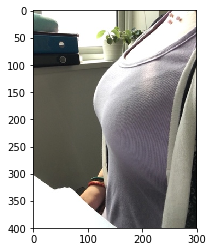

../任务二/3.获取图片/D:\image\06521150b84c343f242ea575bb637f9f.jpg


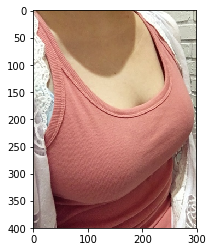

../任务二/3.获取图片/D:\image\06521150b84c343f242ea575bb637f9f.jpg


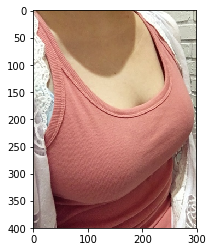

../任务二/3.获取图片/D:\image\3d04669963f1b63f224d557744a81386.jpg


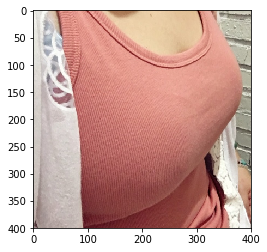

../任务二/3.获取图片/D:\image\3d04669963f1b63f224d557744a81386.jpg


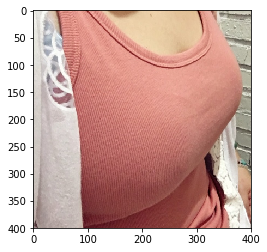

../任务二/3.获取图片/D:\image\7662f77df68d7832a15358ba8b64fcf4.jpg


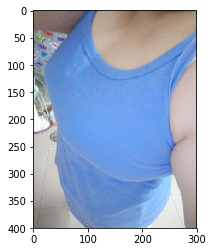

../任务二/3.获取图片/D:\image\7662f77df68d7832a15358ba8b64fcf4.jpg


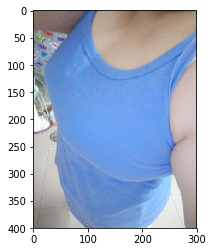

../任务二/3.获取图片/D:\image\4eba9bae76678c75c504041c2ce78330.jpg


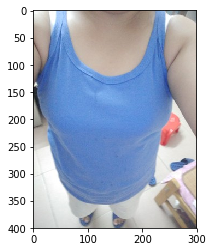

../任务二/3.获取图片/D:\image\4eba9bae76678c75c504041c2ce78330.jpg


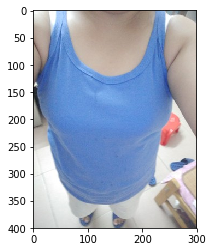

../任务二/3.获取图片/D:\image\ea9e1c6de94d12542cee06e3e496a037.jpg


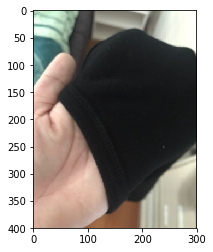

../任务二/3.获取图片/D:\image\ea9e1c6de94d12542cee06e3e496a037.jpg


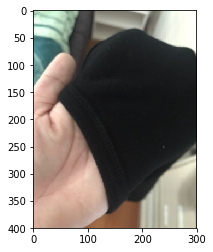

../任务二/3.获取图片/D:\image\078bc12a6b9c297372fd40d6622431d5.jpg


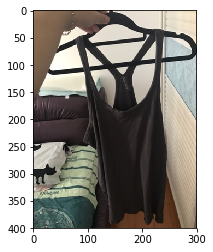

../任务二/3.获取图片/D:\image\078bc12a6b9c297372fd40d6622431d5.jpg


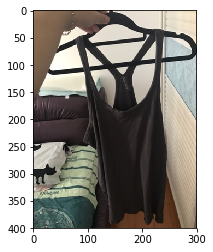

../任务二/3.获取图片/D:\image\01b7a5baa1f24fe9e9e30101218faeb5.jpg


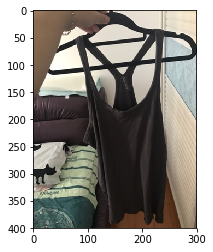

../任务二/3.获取图片/D:\image\01b7a5baa1f24fe9e9e30101218faeb5.jpg


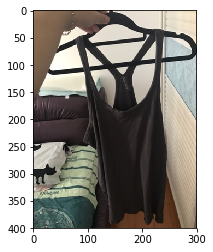

../任务二/3.获取图片/D:\image\597a01a757331caa818d9dabdcce2047.jpg


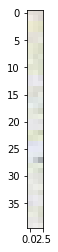

../任务二/3.获取图片/D:\image\597a01a757331caa818d9dabdcce2047.jpg


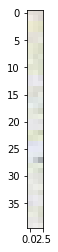

../任务二/3.获取图片/D:\image\a76564cc19d3eac7cf2193a3cbf95e22.jpg


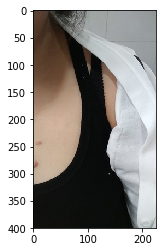

../任务二/3.获取图片/D:\image\a76564cc19d3eac7cf2193a3cbf95e22.jpg


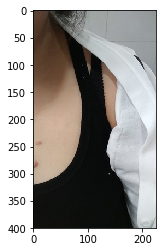

../任务二/3.获取图片/D:\image\d841ab82e40caf05dd7873e26c74f7fe.jpg


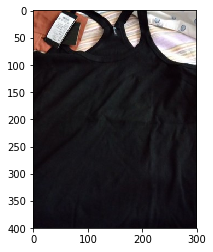

../任务二/3.获取图片/D:\image\d841ab82e40caf05dd7873e26c74f7fe.jpg


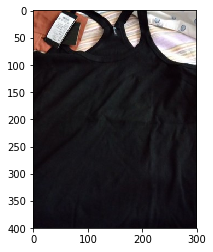

../任务二/3.获取图片/D:\image\222656cfce40675315e6b2659efac4ed.jpg


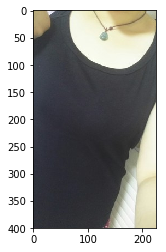

../任务二/3.获取图片/D:\image\222656cfce40675315e6b2659efac4ed.jpg


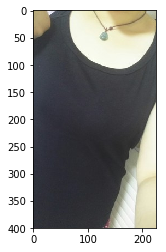

../任务二/3.获取图片/D:\image\a64e20e5fc3218c359b5acfe8498ba68.jpg


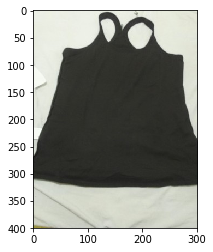

../任务二/3.获取图片/D:\image\a64e20e5fc3218c359b5acfe8498ba68.jpg


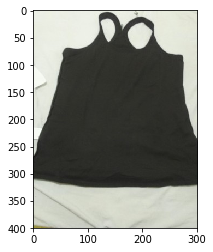

../任务二/3.获取图片/D:\image\b9f2f1ff11c3bbc235ea53086ceb1ffb.jpg


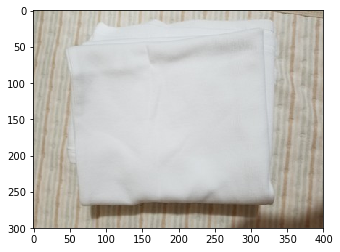

../任务二/3.获取图片/D:\image\b9f2f1ff11c3bbc235ea53086ceb1ffb.jpg


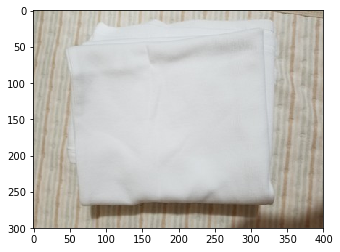

../任务二/3.获取图片/D:\image\da62271d104e4b201cfbef69f9bc8106.jpg


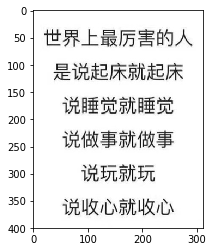

../任务二/3.获取图片/D:\image\da62271d104e4b201cfbef69f9bc8106.jpg


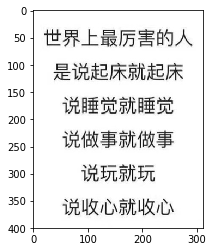

../任务二/3.获取图片/D:\image\ed40cbcad83ddc88689fcf4b57f8ae53.jpg


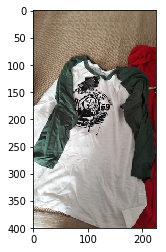

../任务二/3.获取图片/D:\image\ed40cbcad83ddc88689fcf4b57f8ae53.jpg


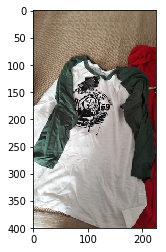

../任务二/3.获取图片/D:\image\210deed43f522ea7704df279bc14ae67.jpg


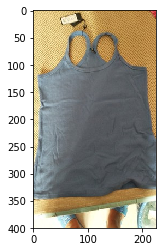

../任务二/3.获取图片/D:\image\210deed43f522ea7704df279bc14ae67.jpg


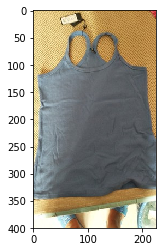

../任务二/3.获取图片/D:\image\70ccf13d0dc4bb7fa20ac8b1f2fd600d.jpg


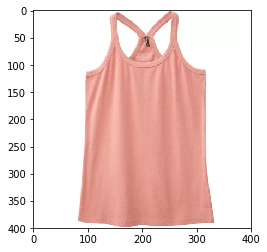

../任务二/3.获取图片/D:\image\70ccf13d0dc4bb7fa20ac8b1f2fd600d.jpg


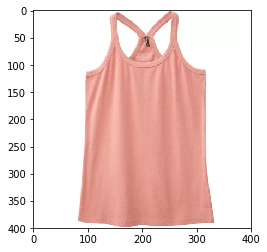

../任务二/3.获取图片/D:\image\9ce2f6dce94e469f4c078d30323a576a.jpg


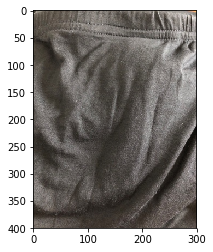

../任务二/3.获取图片/D:\image\9ce2f6dce94e469f4c078d30323a576a.jpg


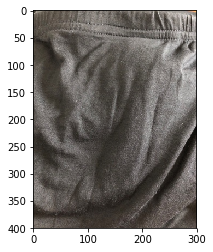

../任务二/3.获取图片/D:\image\13d8886ce22a60034303f4c5f4a8800d.jpg


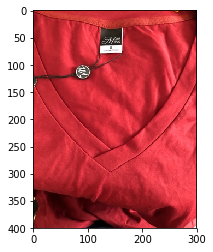

../任务二/3.获取图片/D:\image\13d8886ce22a60034303f4c5f4a8800d.jpg


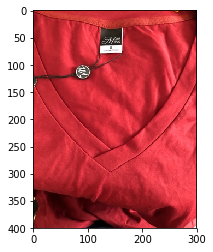

../任务二/3.获取图片/D:\image\f869070744d3c2de1d6ca6a0420fc4ba.jpg


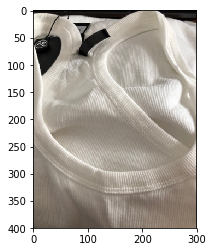

../任务二/3.获取图片/D:\image\f869070744d3c2de1d6ca6a0420fc4ba.jpg


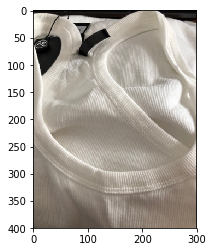

../任务二/3.获取图片/D:\image\dc47ac044799465865d33ed23a2b7fad.jpg


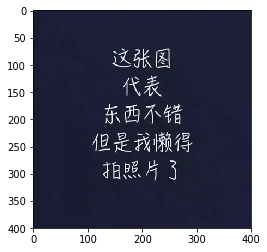

../任务二/3.获取图片/D:\image\dc47ac044799465865d33ed23a2b7fad.jpg


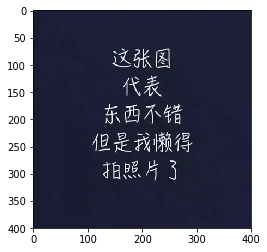

../任务二/3.获取图片/D:\image\83a60cf714c6acdd985f655e7b825d74.jpg


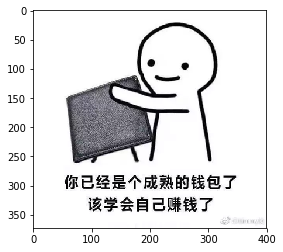

../任务二/3.获取图片/D:\image\83a60cf714c6acdd985f655e7b825d74.jpg


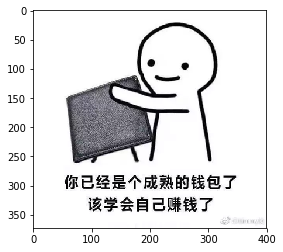

../任务二/3.获取图片/D:\image\f93bad0be5befee62d3922b0c6434fd4.jpg


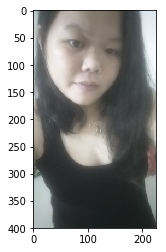

../任务二/3.获取图片/D:\image\f93bad0be5befee62d3922b0c6434fd4.jpg


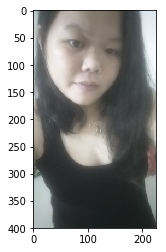

../任务二/3.获取图片/D:\image\259bdb50f5be13c980d637151e30971b.jpg


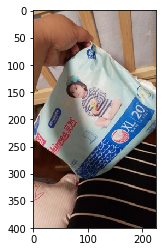

../任务二/3.获取图片/D:\image\259bdb50f5be13c980d637151e30971b.jpg


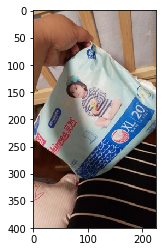

../任务二/3.获取图片/D:\image\dc9845931a9c04e7033547d79cdcdaee.jpg


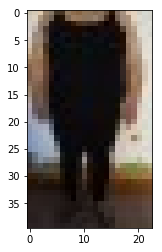

../任务二/3.获取图片/D:\image\dc9845931a9c04e7033547d79cdcdaee.jpg


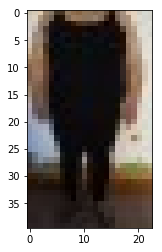

../任务二/3.获取图片/D:\image\39e7821c11c91fdec6121f8ca3702a23.jpg


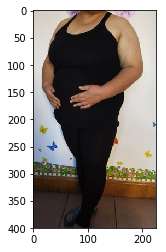

../任务二/3.获取图片/D:\image\39e7821c11c91fdec6121f8ca3702a23.jpg


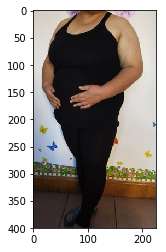

../任务二/3.获取图片/D:\image\d221507869a64d7bfc8af30f82542e68.jpg


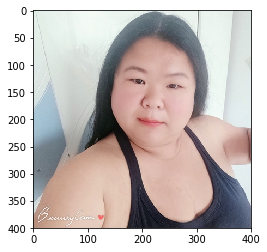

../任务二/3.获取图片/D:\image\d221507869a64d7bfc8af30f82542e68.jpg


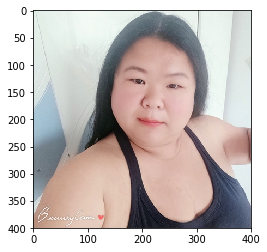

../任务二/3.获取图片/D:\image\10d20ff8edcb78b5ee96369262baf9c5.jpg


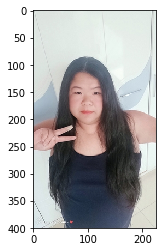

../任务二/3.获取图片/D:\image\10d20ff8edcb78b5ee96369262baf9c5.jpg


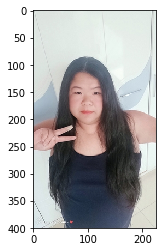

../任务二/3.获取图片/D:\image\93b26edfec900fbc7d4af55d1446b8f0.jpg


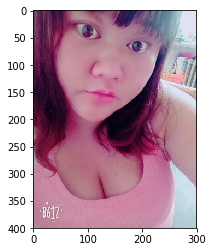

../任务二/3.获取图片/D:\image\93b26edfec900fbc7d4af55d1446b8f0.jpg


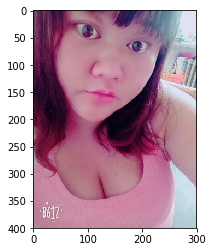

../任务二/3.获取图片/D:\image\ff9357ca9986cbbd2b075ba21c6ea0b5.jpg


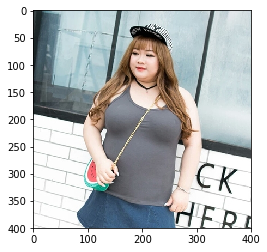

../任务二/3.获取图片/D:\image\ff9357ca9986cbbd2b075ba21c6ea0b5.jpg


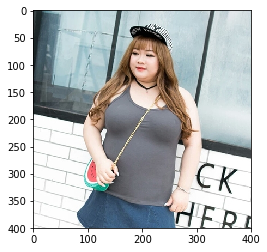

../任务二/3.获取图片/D:\image\8f267d4bcade4f26a9760d32f7153d6e.jpg


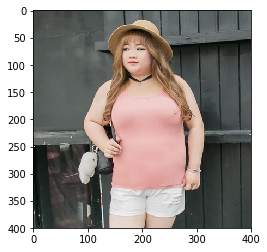

../任务二/3.获取图片/D:\image\8f267d4bcade4f26a9760d32f7153d6e.jpg


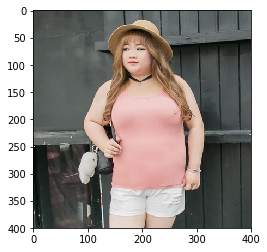

../任务二/3.获取图片/D:\image\eff3185947a81cbb1277d8ef20e6158f.jpg


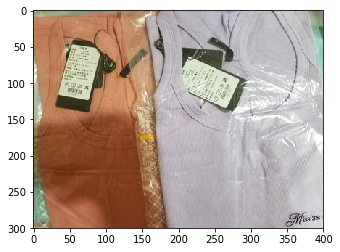

../任务二/3.获取图片/D:\image\eff3185947a81cbb1277d8ef20e6158f.jpg


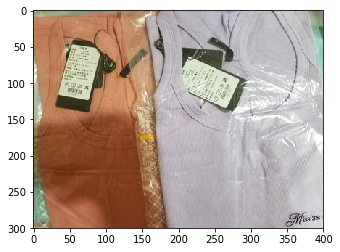

../任务二/3.获取图片/D:\image\038ad471ca2f022c382b2e0ee2226638.jpg


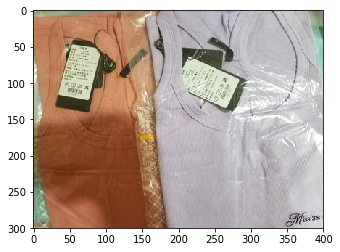

../任务二/3.获取图片/D:\image\038ad471ca2f022c382b2e0ee2226638.jpg


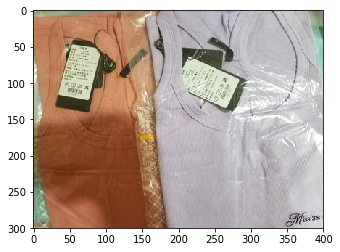

../任务二/3.获取图片/D:\image\3991363eea33235d2c2b6f551acb12a6.jpg


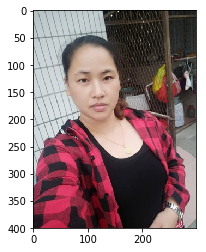

../任务二/3.获取图片/D:\image\3991363eea33235d2c2b6f551acb12a6.jpg


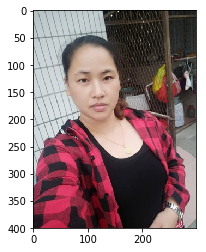

../任务二/3.获取图片/D:\image\dd2c4b8f69463672ed8b4074dfb0c51a.jpg


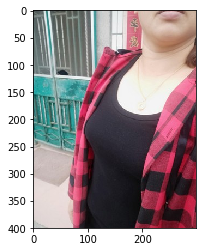

../任务二/3.获取图片/D:\image\dd2c4b8f69463672ed8b4074dfb0c51a.jpg


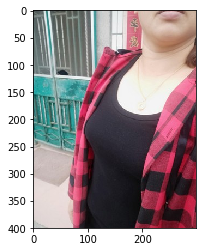

../任务二/3.获取图片/D:\image\9d8286979c8aade8f5d3774a75856ac9.jpg


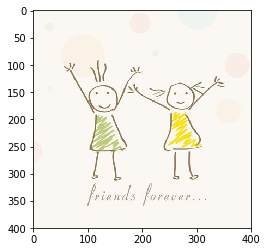

../任务二/3.获取图片/D:\image\9d8286979c8aade8f5d3774a75856ac9.jpg


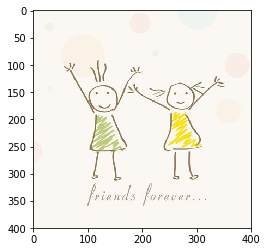

../任务二/3.获取图片/D:\image\ceeb757d85c3931fdced31cf23cae4a4.jpg


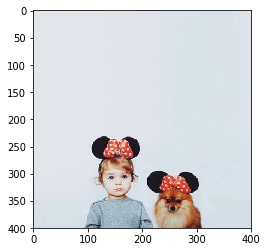

../任务二/3.获取图片/D:\image\ceeb757d85c3931fdced31cf23cae4a4.jpg


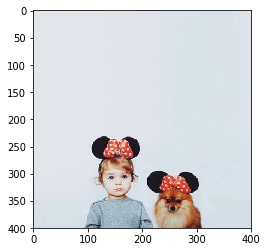

../任务二/3.获取图片/D:\image\5541d810d690809f349ab790ed1cbc08.jpg


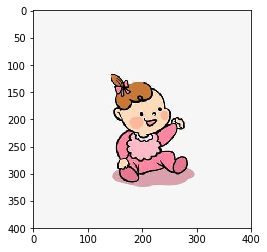

../任务二/3.获取图片/D:\image\5541d810d690809f349ab790ed1cbc08.jpg


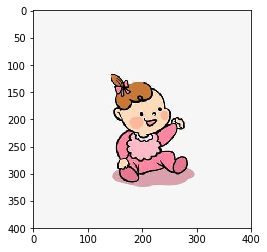

../任务二/3.获取图片/D:\image\727bfdea579359820a0f01459cfb829a.jpg


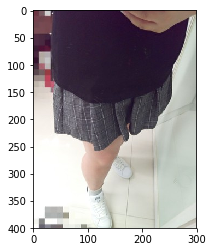

../任务二/3.获取图片/D:\image\727bfdea579359820a0f01459cfb829a.jpg


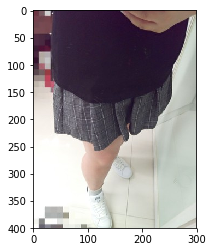

../任务二/3.获取图片/D:\image\8ca8c6450eae9e3115166257ad91a17a.jpg


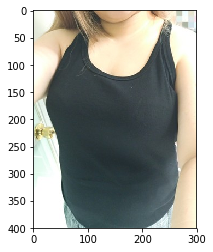

../任务二/3.获取图片/D:\image\8ca8c6450eae9e3115166257ad91a17a.jpg


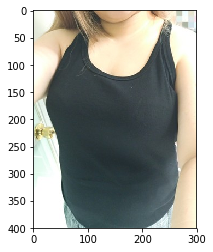

../任务二/3.获取图片/D:\image\6daeb33337fa1646eadf6a13eb7910b9.jpg


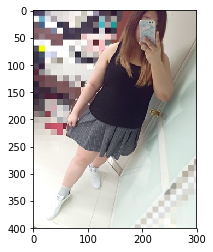

../任务二/3.获取图片/D:\image\6daeb33337fa1646eadf6a13eb7910b9.jpg


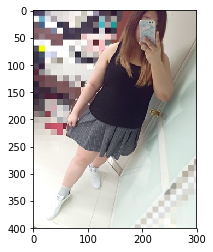

../任务二/3.获取图片/D:\image\ff7a214e5f91506ce7dd14caf1f45229.jpg


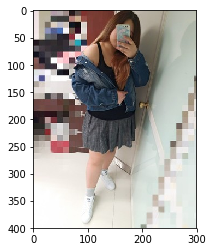

../任务二/3.获取图片/D:\image\ff7a214e5f91506ce7dd14caf1f45229.jpg


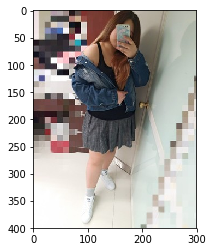

../任务二/3.获取图片/D:\image\33d80b810ecb707e08868c9a00a7ab6f.jpg


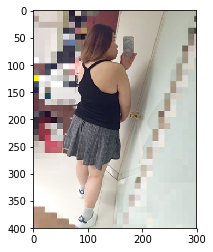

../任务二/3.获取图片/D:\image\33d80b810ecb707e08868c9a00a7ab6f.jpg


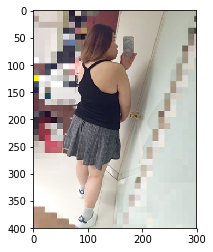

../任务二/3.获取图片/D:\image\dd7112bf67556471e00b8e579cb21c9b.jpg


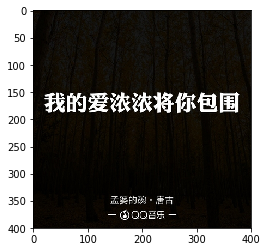

../任务二/3.获取图片/D:\image\dd7112bf67556471e00b8e579cb21c9b.jpg


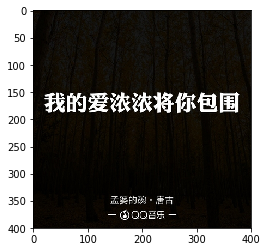

../任务二/3.获取图片/D:\image\32ec61ef05678883f92aaa4beb3261fb.jpg


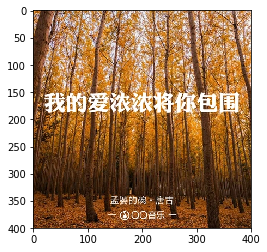

../任务二/3.获取图片/D:\image\32ec61ef05678883f92aaa4beb3261fb.jpg


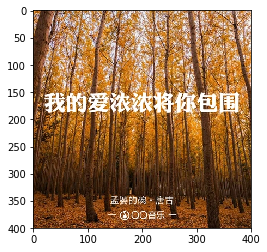

../任务二/3.获取图片/D:\image\42994eba8575b0db9a113a8d8a7dcf5a.jpg


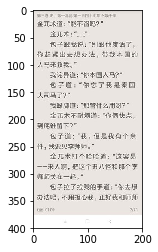

../任务二/3.获取图片/D:\image\42994eba8575b0db9a113a8d8a7dcf5a.jpg


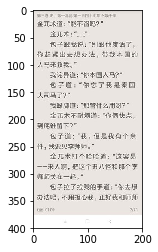

../任务二/3.获取图片/D:\image\84a87d9666700f01bc469ed7c1c4194d.jpg


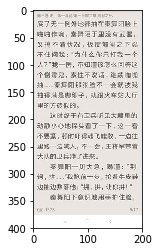

../任务二/3.获取图片/D:\image\84a87d9666700f01bc469ed7c1c4194d.jpg


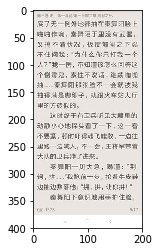

../任务二/3.获取图片/D:\image\3baad59939b01678eeb921cf77567bb7.jpg


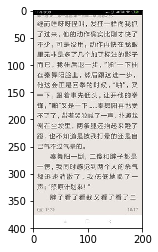

../任务二/3.获取图片/D:\image\3baad59939b01678eeb921cf77567bb7.jpg


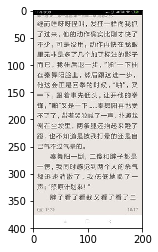

../任务二/3.获取图片/D:\image\9175226477618930a83470ac9ee01aa7.jpg


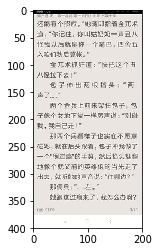

../任务二/3.获取图片/D:\image\9175226477618930a83470ac9ee01aa7.jpg


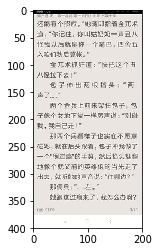

../任务二/3.获取图片/D:\image\d43777d824266f175421112fac7bbe82.jpg


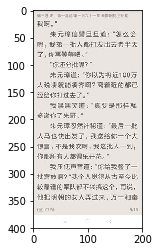

../任务二/3.获取图片/D:\image\d43777d824266f175421112fac7bbe82.jpg


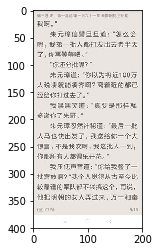

../任务二/3.获取图片/D:\image\903bd19a0c707eda84249dcf453afa41.jpg


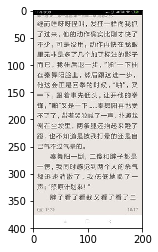

../任务二/3.获取图片/D:\image\903bd19a0c707eda84249dcf453afa41.jpg


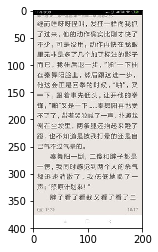

../任务二/3.获取图片/D:\image\65f2a970d0059b64dc87b6a2304b5dce.jpg


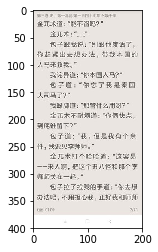

../任务二/3.获取图片/D:\image\65f2a970d0059b64dc87b6a2304b5dce.jpg


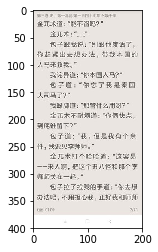

../任务二/3.获取图片/D:\image\43979c3c23c01186b68123be0843aa66.jpg


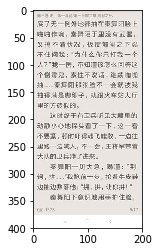

../任务二/3.获取图片/D:\image\43979c3c23c01186b68123be0843aa66.jpg


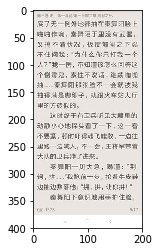

../任务二/3.获取图片/D:\image\96e664984e1315877b9464c90226f727.jpg


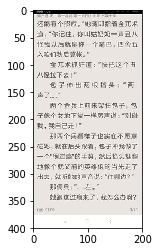

../任务二/3.获取图片/D:\image\96e664984e1315877b9464c90226f727.jpg


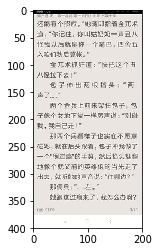

../任务二/3.获取图片/D:\image\ee4c73e04108488ebaa9d2d0b033c2f6.jpg


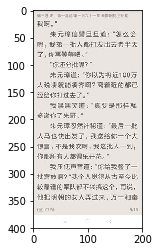

../任务二/3.获取图片/D:\image\ee4c73e04108488ebaa9d2d0b033c2f6.jpg


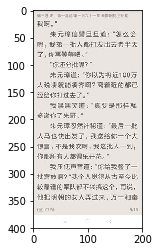

../任务二/3.获取图片/D:\image\d4e205a352c12f199d848127ff5c0554.jpg


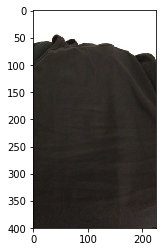

../任务二/3.获取图片/D:\image\d4e205a352c12f199d848127ff5c0554.jpg


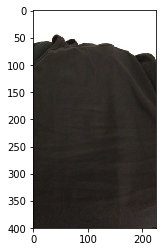

../任务二/3.获取图片/D:\image\5caf4d8d83d05db5aac32bb65b23463d.jpg


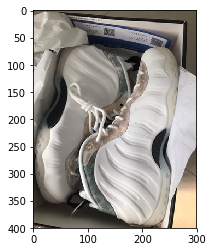

../任务二/3.获取图片/D:\image\5caf4d8d83d05db5aac32bb65b23463d.jpg


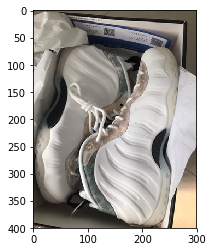

../任务二/3.获取图片/D:\image\2f04dd09410c65976c27286f25598f0b.jpg


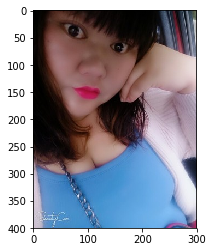

../任务二/3.获取图片/D:\image\2f04dd09410c65976c27286f25598f0b.jpg


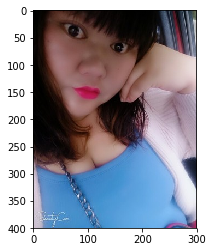

../任务二/3.获取图片/D:\image\cf571cf3e0766ad5c696ea60864f5e9b.jpg


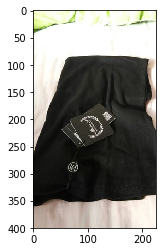

../任务二/3.获取图片/D:\image\cf571cf3e0766ad5c696ea60864f5e9b.jpg


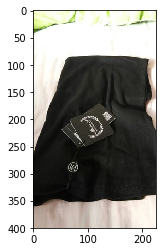

../任务二/3.获取图片/D:\image\0627d741b840e470157a6a37f213ab4a.jpg


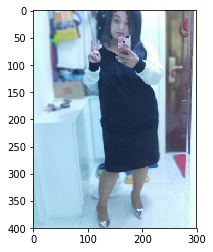

../任务二/3.获取图片/D:\image\0627d741b840e470157a6a37f213ab4a.jpg


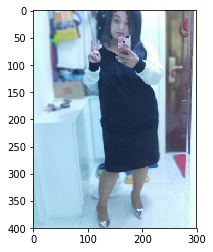

../任务二/3.获取图片/D:\image\627c659d8e213dcefde5d8703bef5257.jpg


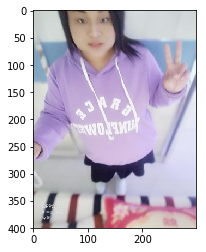

../任务二/3.获取图片/D:\image\627c659d8e213dcefde5d8703bef5257.jpg


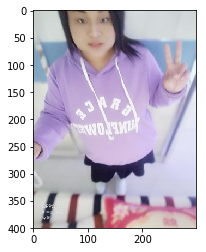

../任务二/3.获取图片/D:\image\25193d6767590510f240a8555d1a4993.jpg


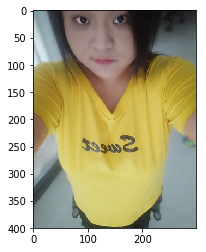

../任务二/3.获取图片/D:\image\25193d6767590510f240a8555d1a4993.jpg


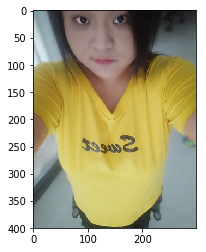

../任务二/3.获取图片/D:\image\28cab4c2cb5c7f9084be13e371cb2dfd.jpg


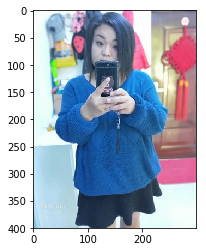

../任务二/3.获取图片/D:\image\28cab4c2cb5c7f9084be13e371cb2dfd.jpg


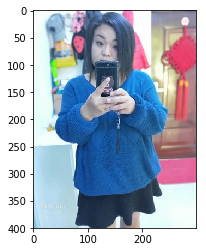

../任务二/3.获取图片/D:\image\f7a682e358111824c4add376485f4514.jpg


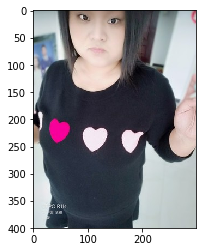

../任务二/3.获取图片/D:\image\f7a682e358111824c4add376485f4514.jpg


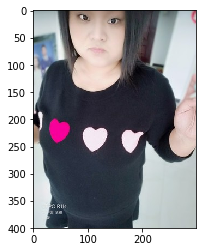

../任务二/3.获取图片/D:\image\827e92a859e289dde8b6723d92dc7ff1.jpg


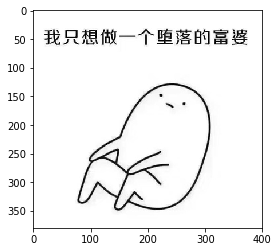

../任务二/3.获取图片/D:\image\827e92a859e289dde8b6723d92dc7ff1.jpg


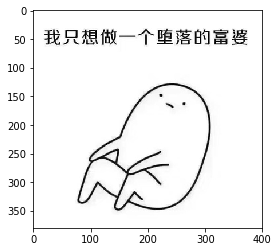

../任务二/3.获取图片/D:\image\7b97493771fbe1a50e9a689d4cf9f52f.jpg


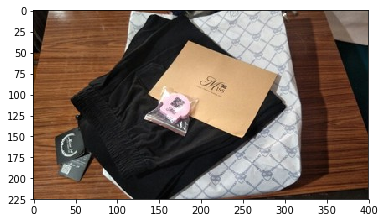

../任务二/3.获取图片/D:\image\7b97493771fbe1a50e9a689d4cf9f52f.jpg


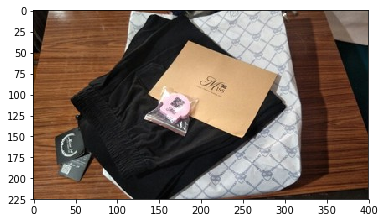

../任务二/3.获取图片/D:\image\18d5dfca02f531938d0eaadddf0639f4.jpg


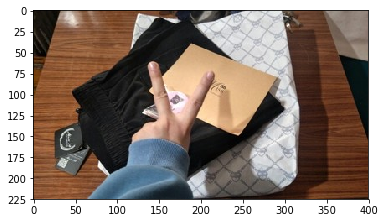

../任务二/3.获取图片/D:\image\18d5dfca02f531938d0eaadddf0639f4.jpg


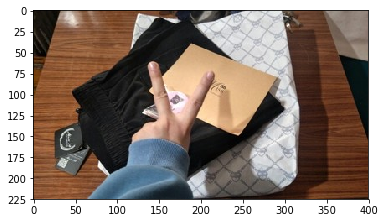

../任务二/3.获取图片/D:\image\36cabfee0a399b8ef6e057b0f0eb6e71.jpg


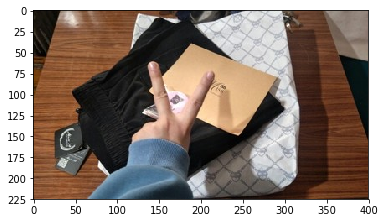

../任务二/3.获取图片/D:\image\36cabfee0a399b8ef6e057b0f0eb6e71.jpg


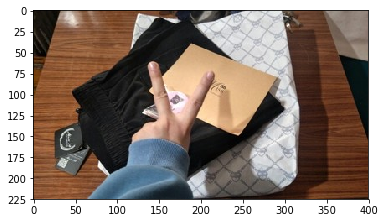

../任务二/3.获取图片/D:\image\7cba849a2232faa118045110f95e6426.jpg


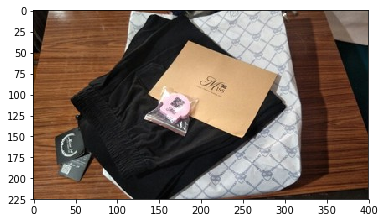

../任务二/3.获取图片/D:\image\7cba849a2232faa118045110f95e6426.jpg


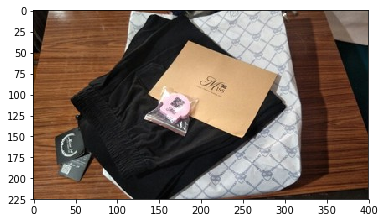

../任务二/3.获取图片/D:\image\c7e2cfe874e99c8dba13ad573eaa5a02.jpg


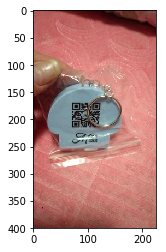

../任务二/3.获取图片/D:\image\c7e2cfe874e99c8dba13ad573eaa5a02.jpg


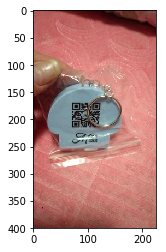

../任务二/3.获取图片/D:\image\eec323f45c39d59242cd71e4dc46530c.jpg


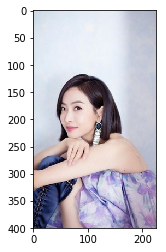

../任务二/3.获取图片/D:\image\eec323f45c39d59242cd71e4dc46530c.jpg


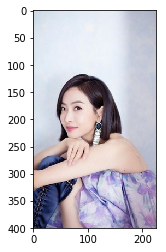

../任务二/3.获取图片/D:\image\becfc3950f4713de8e4ae319f692f596.jpg


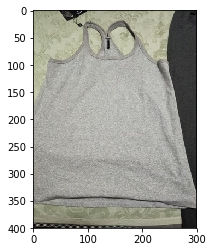

../任务二/3.获取图片/D:\image\becfc3950f4713de8e4ae319f692f596.jpg


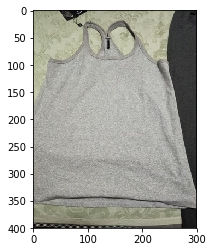

../任务二/3.获取图片/D:\image\e9f99a081c118d90e178d452d635193e.jpg


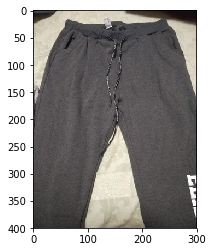

../任务二/3.获取图片/D:\image\e9f99a081c118d90e178d452d635193e.jpg


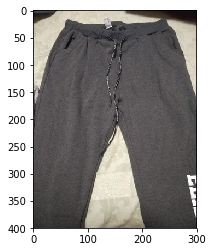

../任务二/3.获取图片/D:\image\c64a4d39c669cda903a2005743e0b321.jpg


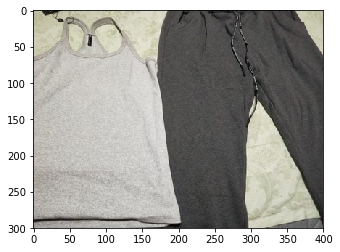

../任务二/3.获取图片/D:\image\c64a4d39c669cda903a2005743e0b321.jpg


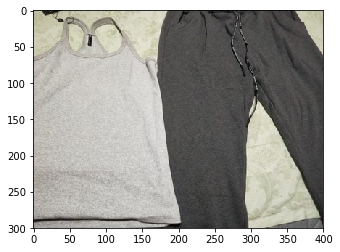

../任务二/3.获取图片/D:\image\749c90118c1fc41e0bf188c0a4f3f1a9.jpg


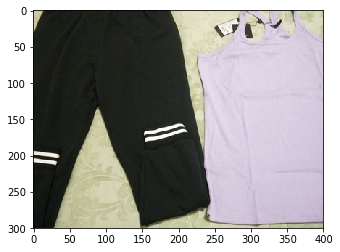

../任务二/3.获取图片/D:\image\749c90118c1fc41e0bf188c0a4f3f1a9.jpg


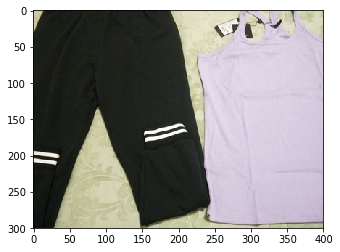

../任务二/3.获取图片/D:\image\764d693b70ba7b3ba679deed7adaf8ba.jpg


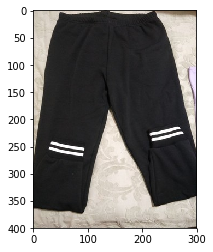

../任务二/3.获取图片/D:\image\764d693b70ba7b3ba679deed7adaf8ba.jpg


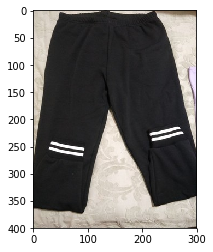

../任务二/3.获取图片/D:\image\52c519968b5d9c967b8a08fd620a436f.jpg


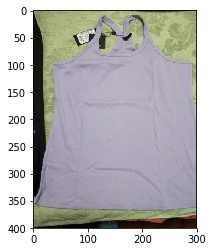

../任务二/3.获取图片/D:\image\52c519968b5d9c967b8a08fd620a436f.jpg


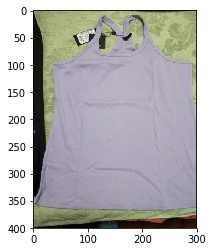

../任务二/3.获取图片/D:\image\d2b83c79ab49023c7e30c92828b37434.jpg


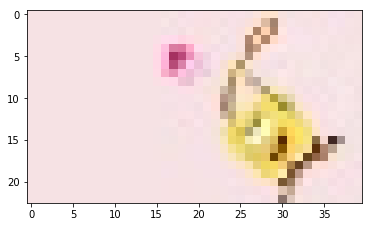

../任务二/3.获取图片/D:\image\d2b83c79ab49023c7e30c92828b37434.jpg


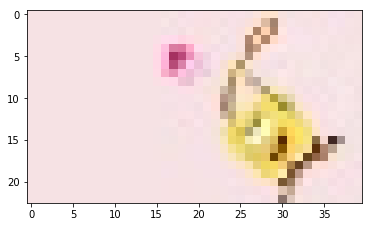

../任务二/3.获取图片/D:\image\b0f5d169b46c91dfb8bc76c76315f1c5.jpg


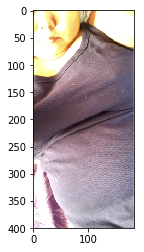

../任务二/3.获取图片/D:\image\b0f5d169b46c91dfb8bc76c76315f1c5.jpg


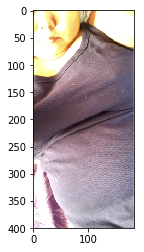

../任务二/3.获取图片/D:\image\875f1f17782df08bee687747dc0189e7.jpg


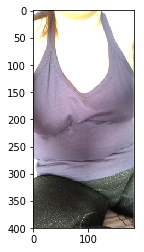

../任务二/3.获取图片/D:\image\875f1f17782df08bee687747dc0189e7.jpg


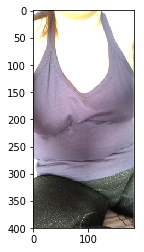

../任务二/3.获取图片/D:\image\d700909fba34418e3d2a19141ab8f25e.jpg


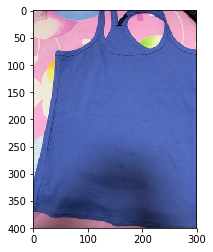

../任务二/3.获取图片/D:\image\d700909fba34418e3d2a19141ab8f25e.jpg


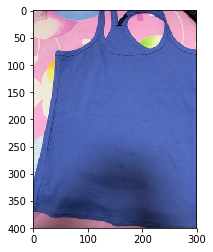

../任务二/3.获取图片/D:\image\2a24b213e7e69a78cae10d32bfe64dd0.jpg


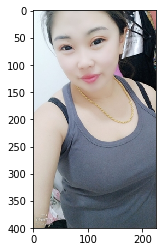

../任务二/3.获取图片/D:\image\2a24b213e7e69a78cae10d32bfe64dd0.jpg


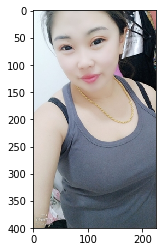

../任务二/3.获取图片/D:\image\a64c9a40ee274754b8c19fa249eb55f5.jpg


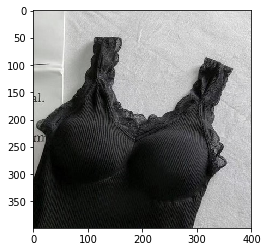

../任务二/3.获取图片/D:\image\a64c9a40ee274754b8c19fa249eb55f5.jpg


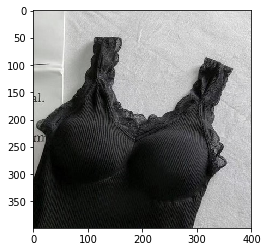

../任务二/3.获取图片/D:\image\dd1751a485fedcd9a74bed77e67644b9.jpg


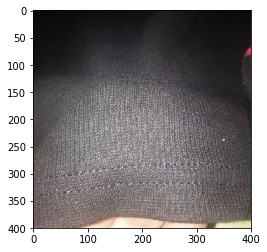

../任务二/3.获取图片/D:\image\dd1751a485fedcd9a74bed77e67644b9.jpg


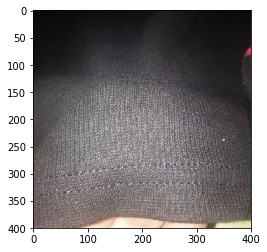

../任务二/3.获取图片/D:\image\144a96a4b03d509bf1ccd086f6306f5e.jpg


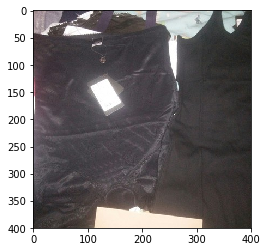

../任务二/3.获取图片/D:\image\144a96a4b03d509bf1ccd086f6306f5e.jpg


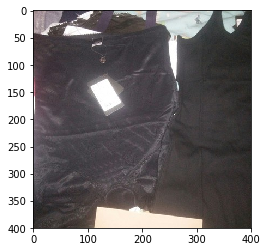

../任务二/3.获取图片/D:\image\e9a2e913eee7127c5a4621effca6b128.jpg


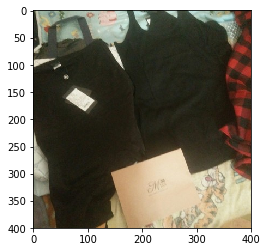

../任务二/3.获取图片/D:\image\e9a2e913eee7127c5a4621effca6b128.jpg


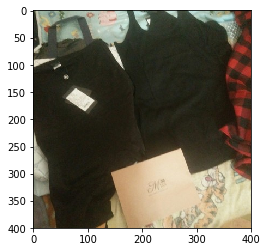

../任务二/3.获取图片/D:\image\a7b09c92725ee59d42a6555b019f2201.jpg


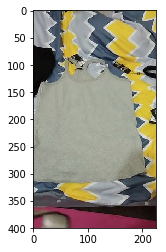

../任务二/3.获取图片/D:\image\a7b09c92725ee59d42a6555b019f2201.jpg


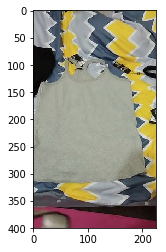

../任务二/3.获取图片/D:\image\3241882519bd8d763ace2fca12d45d81.jpg


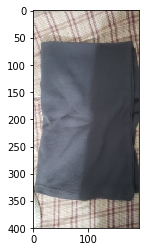

../任务二/3.获取图片/D:\image\3241882519bd8d763ace2fca12d45d81.jpg


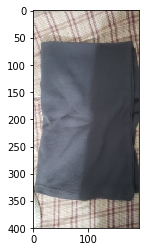

../任务二/3.获取图片/D:\image\428ff5de7add5470da5e65864a85922c.jpg


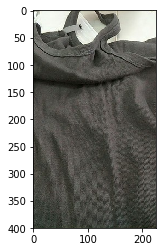

../任务二/3.获取图片/D:\image\428ff5de7add5470da5e65864a85922c.jpg


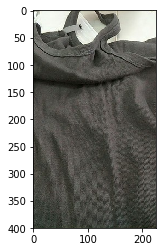

../任务二/3.获取图片/D:\image\cdb375042af3b3c2eaff396910dcc617.jpg


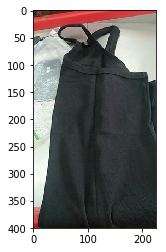

../任务二/3.获取图片/D:\image\cdb375042af3b3c2eaff396910dcc617.jpg


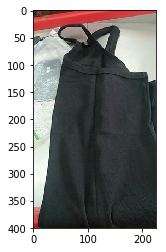

../任务二/3.获取图片/D:\image\893a54d36d58ccc7cc1e6b614e1f6b08.jpg


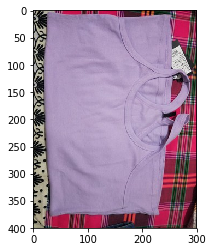

../任务二/3.获取图片/D:\image\893a54d36d58ccc7cc1e6b614e1f6b08.jpg


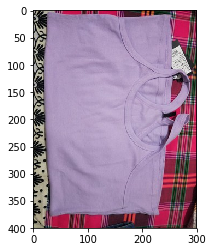

../任务二/3.获取图片/D:\image\f6906729212fe812472a55839d98b51e.jpg


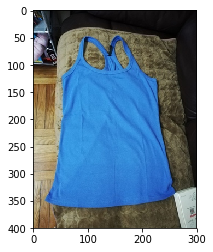

../任务二/3.获取图片/D:\image\c4fce4430ad0c30c90174de5bb4a60a8.jpg


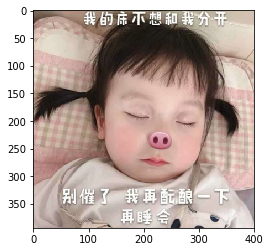

../任务二/3.获取图片/D:\image\c4fce4430ad0c30c90174de5bb4a60a8.jpg


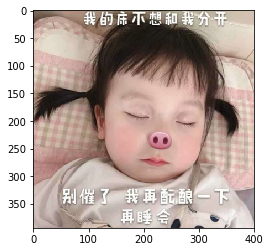

../任务二/3.获取图片/D:\image\b22f007f481afdecfba45e739b91064e.jpg


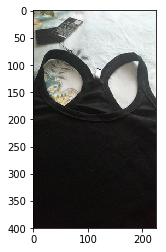

../任务二/3.获取图片/D:\image\52562e2cc954a9a236ba097c5019a1a8.jpg


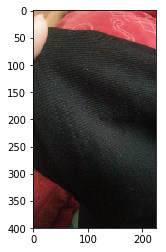

../任务二/3.获取图片/D:\image\0d4a64fe9ebe0bb2ec35b4bfdb85b30e.jpg


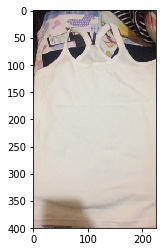

../任务二/3.获取图片/D:\image\2d8521337f273e32e3ff04417f338738.jpg


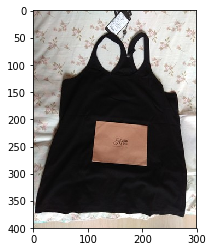

../任务二/3.获取图片/D:\image\e13417bbee735b237f5f87e39b1c20b3.jpg


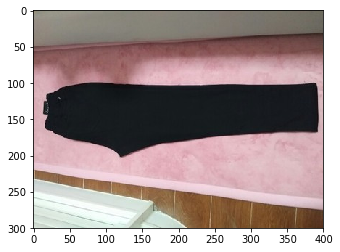

../任务二/3.获取图片/D:\image\d5bcdfdb75cf16558b216e4e6b70d214.jpg


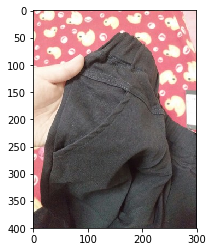

../任务二/3.获取图片/D:\image\0a3ae37f328a8e7eda952ce1b95ecd72.jpg


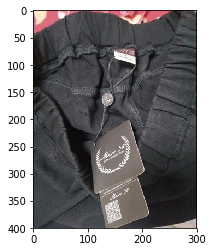

../任务二/3.获取图片/D:\image\e7ff9ed5883eba6c52203faf7cb0dc29.jpg


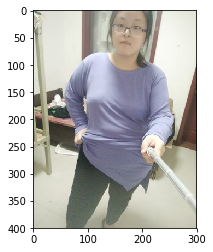

../任务二/3.获取图片/D:\image\97d2e49fb44a5adc97708622a8d9fce6.jpg


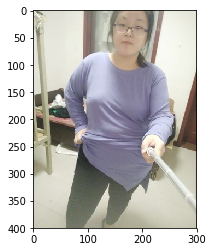

../任务二/3.获取图片/D:\image\ad343c00cda82f15fcdf562bc0da1a2e.jpg


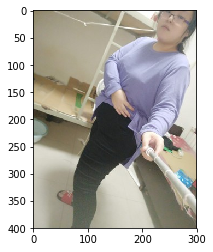

../任务二/3.获取图片/D:\image\5a222fa1434188f43271ccad68d64b63.jpg


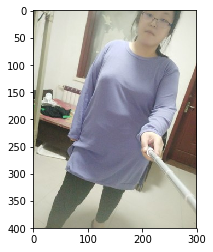

../任务二/3.获取图片/D:\image\83f4ad8a32142db6cda1b49fcb099deb.jpg


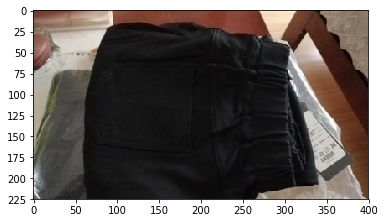

../任务二/3.获取图片/D:\image\83f4ad8a32142db6cda1b49fcb099deb.jpg


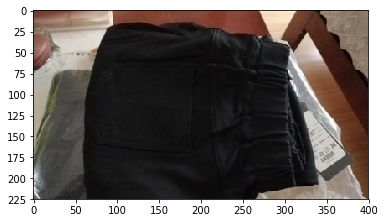

../任务二/3.获取图片/D:\image\ce0d82b29dd40c12dae912889774f465.jpg


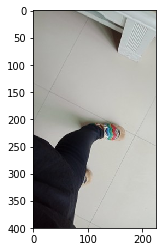

../任务二/3.获取图片/D:\image\ce0d82b29dd40c12dae912889774f465.jpg


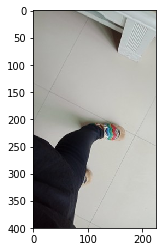

../任务二/3.获取图片/D:\image\783ada8fdef6daed13684cf4fd215415.jpg


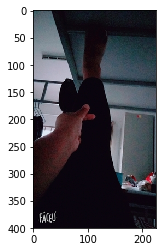

In [10]:
shape_complexity_df = image_list.loc[(image_list.position=='4'),['product_id','review_id','sequence','pic_md5']].sort_values(by=['product_id','review_id','sequence'], ascending=True).head(210)
for path in shape_complexity_df['pic_md5']:
    pic_path = 'D:\\image\\' + path + '.jpg'
    pic_path2 = ''
    if pic_path in files:
        pic_path2 = '../任务二/3.获取图片/' + pic_path     
    try:
        img = cv2.imread(pic_path2)
        cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(cv_rgb)
        print(pic_path2)
    except:
        print('')
    else:
        plt.show()

In [237]:
image_list_all.to_csv('/home/mk/Desktop/image_calculation_test.csv',encoding='utf-8')